### Importing Libraries

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go

from collections import Counter

import warnings
warnings.filterwarnings('ignore')

### Reading Dataset

In [2]:
ds = pd.read_csv("terrorism.csv",encoding='ISO-8859-1',low_memory = False)

In [3]:
ds.head(2)

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN


In [4]:
ds.shape

(181691, 135)

In [5]:
print(ds.columns)

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)


In [6]:
ds.rename(columns={'iyear':'Year','imonth':'Month',
                   'city':'City','iday':'Day',
                   'country_txt':'Country','region_txt':'Region',
                   'attacktype1_txt':'AttackType','target1':'Target',
                   'nkill':'Killed','nwound':'Wounded',
                   'summary':'Summary','gname':'Group',
                   'targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type',
                   'motive':'Motive'},inplace=True)

In [7]:
ds['Casualities'] = ds.Killed + ds.Wounded
ds = ds[['Year','Month','Day','Country','Region','City','latitude','longitude','AttackType','Killed','Wounded','Casualities','Target','Group','Target_type','Weapon_type']]
ds.head(5)

,Year,Month,Day,Country,Region,City,latitude,longitude,AttackType,Killed,Wounded,Casualities,Target,Group,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,1.0,Julio Guzman,MANO-D,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,Government (Diplomatic),Unknown
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,1.0,Employee,Unknown,Journalists & Media,Unknown
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,NaN,U.S. Embassy,Unknown,Government (Diplomatic),Explosives
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,NaN,U.S. Consulate,Unknown,Government (Diplomatic),Incendiary


### Missing data check:

In [8]:
ds.isnull().sum()

Year               0
Month              0
Day                0
Country            0
Region             0
City             434
latitude        4556
longitude       4557
AttackType         0
Killed         10313
Wounded        16311
Casualities    16874
Target           636
Group              0
Target_type        0
Weapon_type        0
dtype: int64

In [9]:
ds.dropna(axis = 0,inplace = True)

In [10]:
ds.shape

(159946, 16)

In [11]:
ds.isnull().sum()

Year           0
Month          0
Day            0
Country        0
Region         0
City           0
latitude       0
longitude      0
AttackType     0
Killed         0
Wounded        0
Casualities    0
Target         0
Group          0
Target_type    0
Weapon_type    0
dtype: int64

#### YearlyTerrorist Attack Count

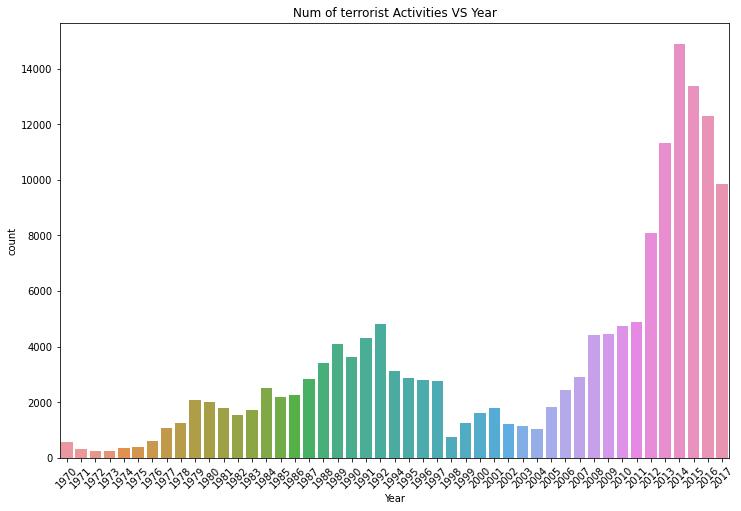

In [12]:
plt.figure(figsize = (12,8))
sns.countplot(x = "Year",data = ds)
plt.xticks(rotation = 45 )
plt.title("Num of terrorist Activities VS Year")
plt.show()

### Observation

From the Graph,
- 2013-2017 have highest attacks[especially **2014 on peak** ]
- Gradual Increase in terror activities _since **2004_ 
- __Decrease in activities__ since 2014

* Monthly Analysis 👇🏻

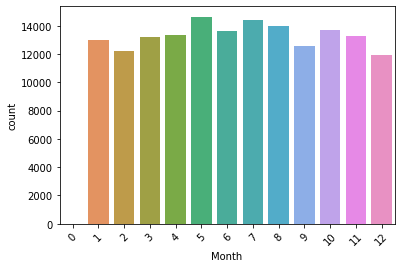

In [13]:
ds['Month'].value_counts()
sns.countplot(x = 'Month',data = ds)
plt.xticks(rotation = 45)
plt.show()

* Terrorist Activities in a year [by region] 👇🏻

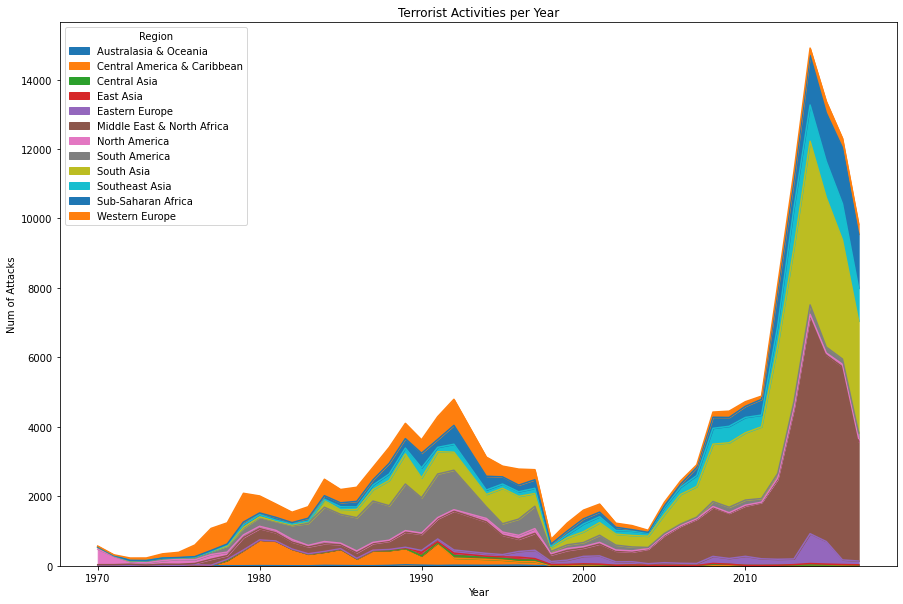

In [14]:
pd.crosstab(ds.Year,ds.Region).plot(kind = 'area',figsize =(15,10))
plt.title("Terrorist Activities per Year")
plt.ylabel("Num of Attacks")
plt.show()

* Terrorist Attack affected regions ⬇️

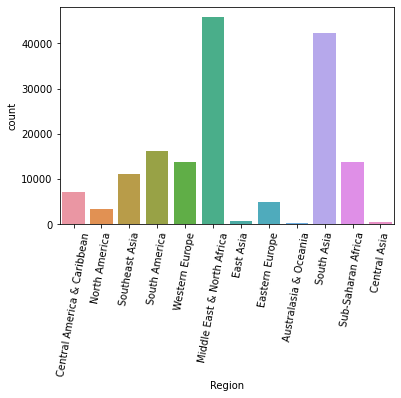

In [15]:
ds["Region"].value_counts()
sns.countplot(x = "Region",data = ds)
plt.xticks(rotation = 80)
plt.show()

- Yearly Casualities 👇🏻

In [16]:
year_cas = ds.groupby('Year').Casualities.sum().to_frame().reset_index()
year_cas.columns = ['Year','Casualities']
px.bar(data_frame = year_cas,x = 'Year',y = 'Casualities',color='Casualities',template='plotly_dark')

- As observed above, _Casualities_ are highest in **2015**  ⬆️

- Types of Target Attacks ⬇️

In [17]:
target = list(ds['Target_type'])
target_map = dict(Counter(target))
target_ds = pd.DataFrame(target_map.items())
target_ds.columns = ['Target Type','Count']
px.bar(data_frame = target_ds,x = 'Target Type',y = 'Count',color='Target Type',template='plotly_white')

- As observed 👆🏻,<br>
    **Private citizens** and <b>property</b> count the _highest_ in all

#### Type of Attacks Analysis: 

In [18]:
AttackType=ds.pivot_table(columns='AttackType',values='Casualities',aggfunc='sum')
AttackType = AttackType.T
AttackType['Type'] = AttackType.index

* <b>Attack Type</b> ⬇️

In [19]:
labels = AttackType.columns.tolist()
attack=AttackType.T
values=attack.values.tolist()
values = sum(values,[])
attack_type = list(ds['AttackType'].unique())
fig = go.Figure(data=[go.Pie(labels = attack_type,values=values,hole=.3)])
fig.update_layout(template = 'gridon')
fig.show()

- <b>Count of weapon chosen for attack ⬇️

In [20]:
from collections import Counter
values = list(ds['AttackType'])
value_map = dict(Counter(values))
value_dataset = pd.DataFrame(value_map.items())
value_dataset.columns = ["AttackType","Count of Attack Type"]
px.bar(data_frame=value_dataset,x = 'AttackType',y = 'Count of Attack Type',color = 'AttackType',template="plotly_white")

- <b> Plotting the HOT-ZONE of Terrorism on the highest year of Terrorist Attack i.e. 2014.  ⬇️

In [23]:
import folium
from folium.plugins import MarkerCluster
year=ds[ds['Year']==2014]
mapData=year.loc[:,'City':'longitude']
mapData=mapData.dropna().values.tolist()

map = folium.Map(location = [0, 50], tiles='CartoDB positron', zoom_start=2) 
markerCluster = folium.plugins.MarkerCluster().add_to(map)
for point in range(0, len(mapData)):
    folium.Marker(location=[mapData[point][1],mapData[point][2]],
                  popup = mapData[point][0]).add_to(markerCluster)
map